#### Modules

In [ ]:
import os
import json
from pathlib import Path
import torch
import torch.nn as nn
import torch.nn.functional as F
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader

# Preventing potential issues with multiple OpenMP libraries (common with PyTorch and some other libraries)
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'

#### Original CNN Architecture (putting the parameters back in)

In [21]:
# Keep architecture identical to the training notebook so state_dict loading matches.
class CNNBinary(nn.Module):
    def __init__(self):
        super().__init__()
        
        # Match Phase 2 architecture exactly
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),
            
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),
            
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),
            
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Linear(32, 1)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x

#### Utilize GPU

In [22]:
# Use GPU when available.
if torch.cuda.is_available():
    device = torch.device("cuda")
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available() and torch.backends.mps.is_built():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

#### Reload models and metadata from phase 2

In [23]:
# Define paths to the model files and metadata
root = Path(".")
walls_model_path = root / "model_walls.pth"
decks_model_path = root / "model_decks.pth"
metadata_path = root / "model_metadata.json"

# Use GPU for CNN
model_walls = CNNBinary().to(device)
model_decks = CNNBinary().to(device)

# Load the parameters of the trained model (state_dict) into the model architecture
model_walls.load_state_dict(torch.load(walls_model_path, map_location=device))
model_decks.load_state_dict(torch.load(decks_model_path, map_location=device))

# Load the thresholds from the metadata file
model_walls.eval()
model_decks.eval()
with metadata_path.open("r", encoding="utf-8") as f:
    metadata = json.load(f)
best_threshold_walls = metadata.get("best_threshold_walls", 0.5)
best_threshold_decks = metadata.get("best_threshold_decks", 0.5)

# Check whether the models and metadata are loaded correctly
print("Models and metadata loaded successfully.")
print(f"Device: {device}")
print(f"Walls threshold: {best_threshold_walls}")
print(f"Decks threshold: {best_threshold_decks}")

Models and metadata loaded successfully.
Device: cuda
Walls threshold: 0.1
Decks threshold: 0.1


#### 10 sample wall images from the original Wall dataset

In [24]:
# Load  the original wall datasets
df_walls = pd.read_pickle('wall_data.pkl')
    
# Select 10 cracked and 10 non-cracked wall images for visualization
num_img = 10
cracked_walls = df_walls[df_walls['Label'] == 'Cracked'].sample(num_img, random_state=42)
non_cracked_walls = df_walls[df_walls['Label'] == 'Non-Cracked'].sample(num_img, random_state=42)

# Combine them
sample_wall_images = pd.concat([cracked_walls, non_cracked_walls]).reset_index(drop=True)
print(f"Selected {len(sample_wall_images)} sample wall images for filter visualization")
print(f"Distribution: {sample_wall_images['Label'].value_counts().to_dict()}")

Selected 20 sample wall images for filter visualization
Distribution: {'Cracked': 10, 'Non-Cracked': 10}


#### 10 sample deck images from the original deck dataset

In [25]:
# Load the original deck datasets
df_decks = pd.read_pickle('deck_data.pkl')

# Select 5 cracked and 5 non-cracked deck images for visualization
num_img = 10
cracked_decks = df_decks[df_decks['Label'] == 'Cracked'].sample(num_img, random_state=42)
non_cracked_decks = df_decks[df_decks['Label'] == 'Non-Cracked'].sample(num_img, random_state=42)

# Combine them
sample_deck_images = pd.concat([cracked_decks, non_cracked_decks]).reset_index(drop=True)
print(f"Selected {len(sample_deck_images)} sample deck images for filter visualization")
print(f"Distribution: {sample_deck_images['Label'].value_counts().to_dict()}")

Selected 20 sample deck images for filter visualization
Distribution: {'Cracked': 10, 'Non-Cracked': 10}


#### Determine the predicted results for sample images

In [26]:
# Function to get the CNN model's prediction for an image (Cracked or Non-Cracked)
def get_model_prediction(image, model, threshold):
    
    # Convert image to tensor and normalize
    img_tensor = torch.from_numpy(image.astype(np.float32) / 255.0)
    
    # Ensure it's 3 channels (RGB)
    if img_tensor.ndim == 2:
        img_tensor = img_tensor.unsqueeze(0).repeat(3, 1, 1)
    elif img_tensor.shape[2] == 3:
        img_tensor = img_tensor.permute(2, 0, 1)
    img_tensor = img_tensor.unsqueeze(0).to(device)
    
    # retrieve predicted probability and class label
    with torch.no_grad():
        logit = model(img_tensor).squeeze()
        probability = torch.sigmoid(logit).item()
        prediction = 'Cracked' if probability >= threshold else 'Non-Cracked'
    return prediction, probability

#### Extract Learned Filters from First Convolutional Layer

In [27]:
# Function to apply convolutional filters defined in the CNN model to an image and return the feature maps.
def apply_conv_layer(image, model, layer_idx=0):
    
    # Convert image to tensor and normalize
    img_tensor = torch.from_numpy(image.astype(np.float32) / 255.0)
    
    # Ensure it's 3 channels
    if img_tensor.ndim == 2:
        img_tensor = img_tensor.unsqueeze(0).repeat(3, 1, 1)
    elif img_tensor.shape[2] == 3:
        img_tensor = img_tensor.permute(2, 0, 1) 
    img_tensor = img_tensor.unsqueeze(0).to(device) 
    
    # Apply first conv layer and ReLU
    with torch.no_grad():
        conv_output = model.features[0](img_tensor) 
        activated_output = model.features[1](conv_output)  
    return activated_output.squeeze(0).cpu().numpy()

#### Visualize original images and selected filter responses for 10 sample images

In [28]:
# Function to visualize filter responses and prediction results for each sample image
def visualize_filters(num_filters, filter_indices,sample_images, model, best_threshold):
    for img_idx in range(len(sample_images)):
        row = sample_images.iloc[img_idx]
        image = row['ImageData']
        actual_label = row['Label']
        
        # Get model prediction
        predicted_label, confidence = get_model_prediction(image, model, best_threshold)
        
        # Apply filters
        filtered_images = apply_conv_layer(image, model)
        
        # Create visualization
        fig = plt.figure(figsize=(18, 3))
        gs = GridSpec(1, num_filters + 1, figure=fig)
        
        # Original image
        ax0 = fig.add_subplot(gs[0, 0])
        ax0.imshow(image)
        ax0.set_title(f'Actual: {actual_label} \nPredicted: {predicted_label} \nConfidence: {confidence:.3f}', fontsize=9, fontweight='bold')
        ax0.axis('off')
        
        # Filtered images
        for i, filter_idx in enumerate(filter_indices):
            ax = fig.add_subplot(gs[0, i + 1])
            feature_map = filtered_images[filter_idx]
            ax.imshow(feature_map, cmap='viridis')
            ax.set_title(f'Filter {filter_idx+1}\nResponse', fontsize=10, fontweight='bold')
            ax.axis('off')
        
        # Set overall title and layout
        plt.suptitle(f'Image {img_idx+1} - Original vs Filter Responses', fontsize=12, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.show()
        plt.close(fig)
        
        # Clear GPU cache every few iterations to prevent memory buildup
        if device.type == 'cuda' and (img_idx + 1) % 3 == 0:
            torch.cuda.empty_cache()

#### Validate CNN model through sample inspection

1. The poor performance of the models was largely due to the noisely labels

2. Based on the observation of the filters, the model walls is much more effective than model decks

3. Good thing is that the noisely labels do not affect the model from identifying cracks in the images, only affected the optimal threhold being selected.

#### Validation for wall model

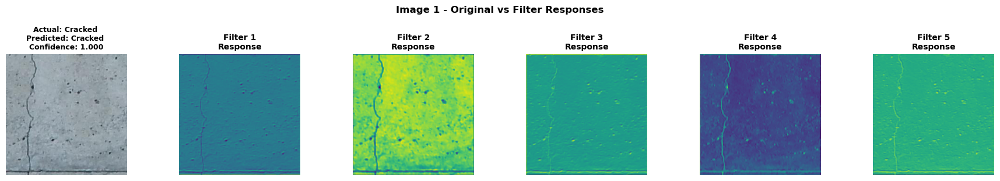

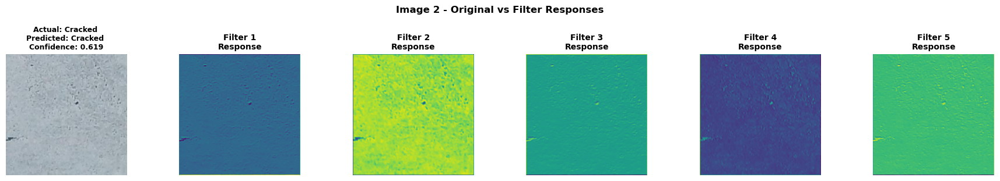

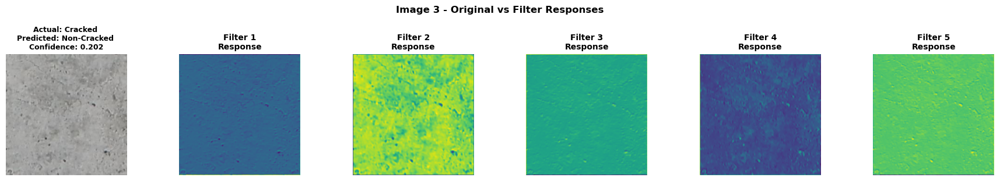

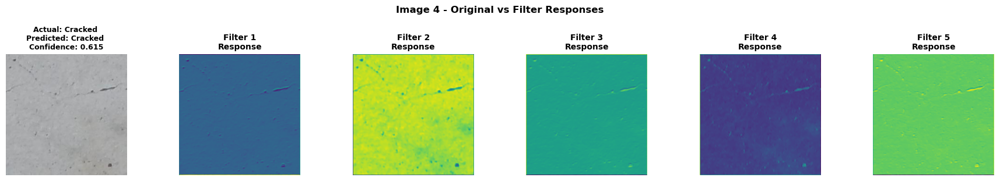

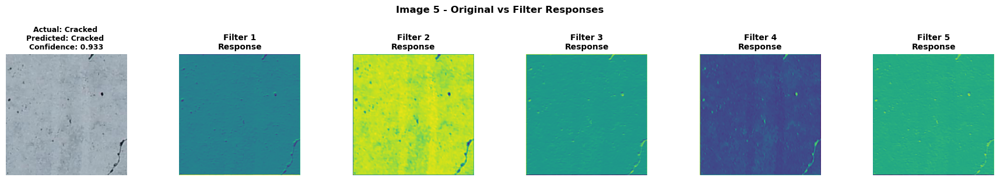

...

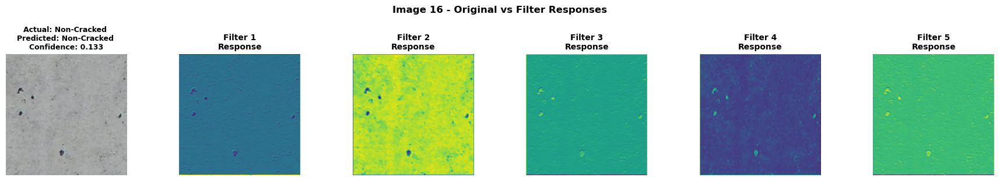

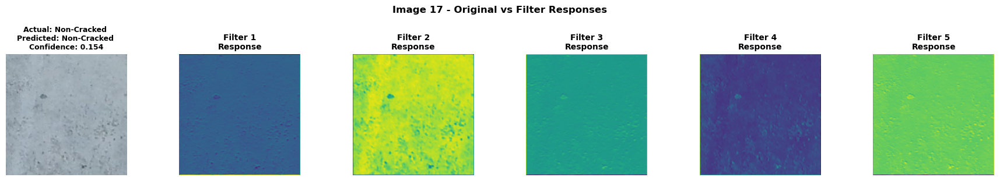

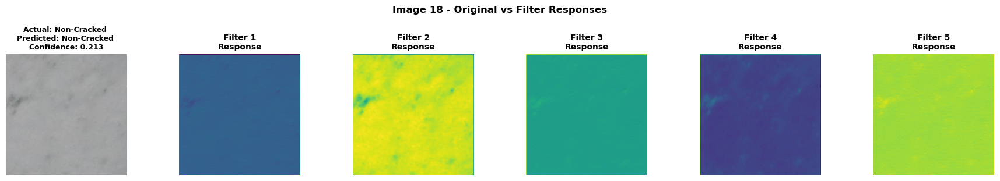

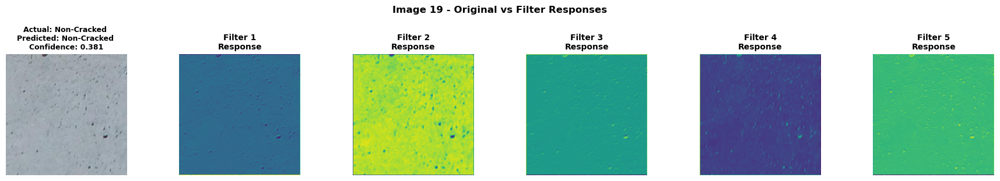

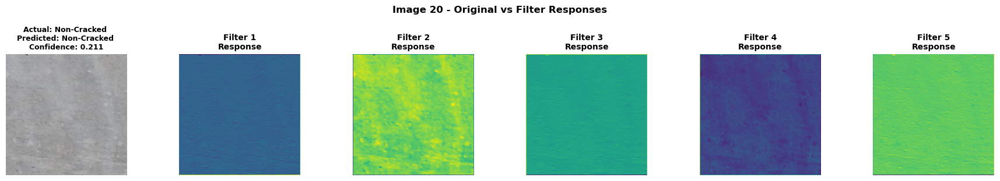

In [29]:
visualize_filters(num_filters = 5, filter_indices = [0, 1, 2, 3, 4], sample_images = sample_wall_images, 
                  model = model_walls, best_threshold = 0.5)

#### Validation for deck model

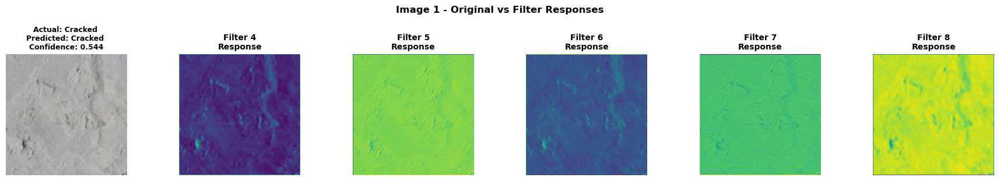

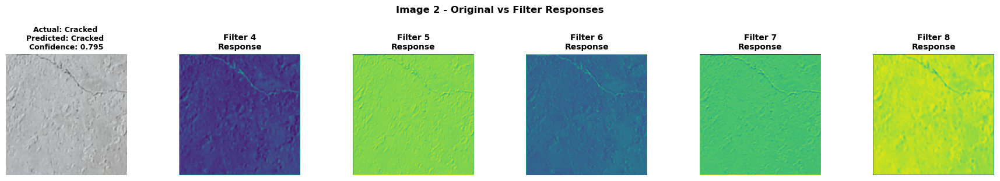

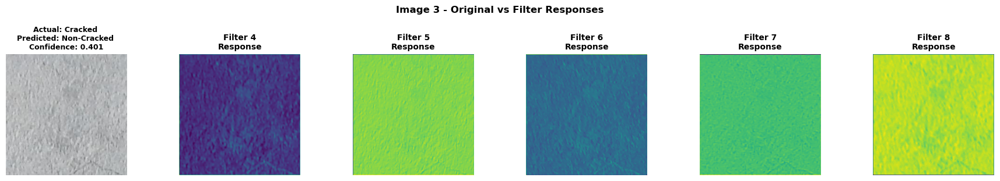

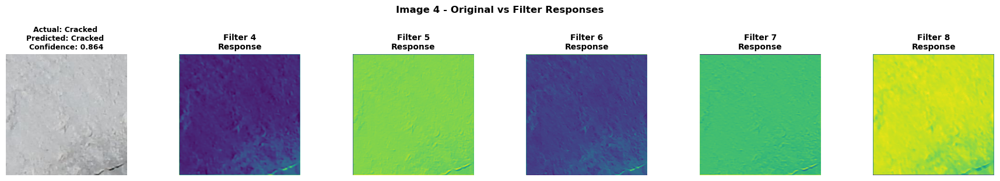

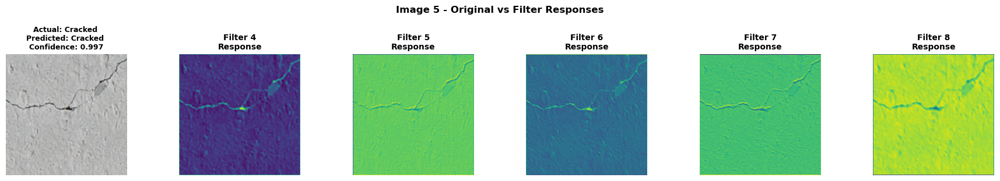

...

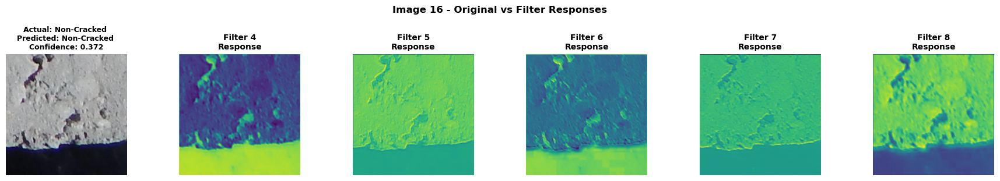

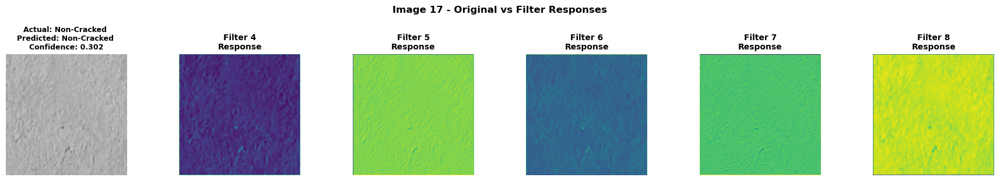

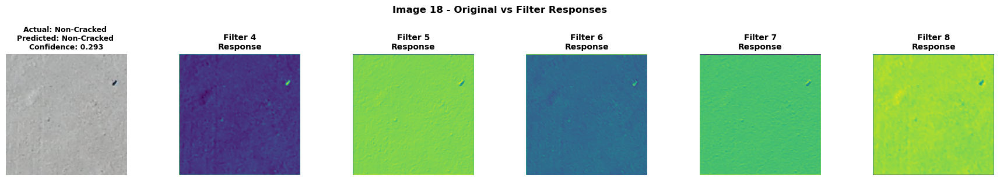

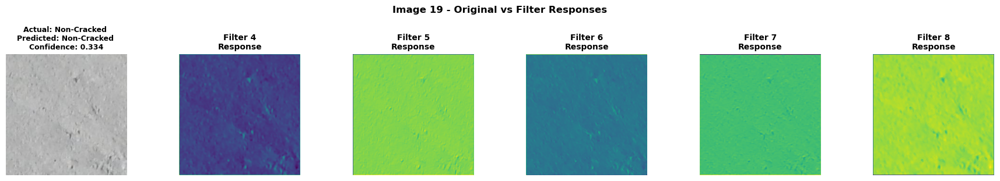

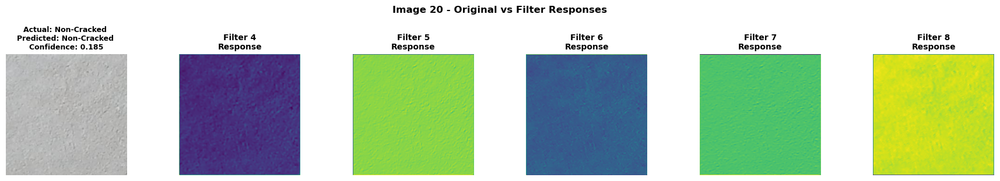

In [30]:
visualize_filters(num_filters = 5, filter_indices = [3, 4, 5, 6, 7], sample_images = sample_deck_images, 
                  model = model_decks, best_threshold = 0.5)

#### Identify images with high residuals in training phase

In [1]:
def analyze_confident_misclassifications(model, dataloader, dataset_type, confidence_threshold=0.8):
    
    model.eval()
    
    false_positives = []  # Model says cracked (high conf) but actually uncracked
    false_negatives = []  # Model says uncracked (high conf) but actually cracked
    
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy()
            
            for i, (prob, label) in enumerate(zip(probs, labels)):
                confidence = max(prob[0], 1 - prob[0])
                prediction = 1 if prob[0] > 0.5 else 0
                
                if confidence > confidence_threshold:
                    if prediction == 1 and label == 0:  # False positive
                        false_positives.append((images[i].cpu(), prob[0], confidence))
                    elif prediction == 0 and label == 1:  # False negative
                        false_negatives.append((images[i].cpu(), prob[0], confidence))
    
    # Visualize results
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    fig.suptitle(f'{dataset_type} - High Confidence Misclassifications', fontsize=14, fontweight='bold')
    
    # Plot false positives (top row)
    for idx, (img, prob, conf) in enumerate(false_positives[:5]):
        ax = axes[0, idx]
        ax.imshow(img.permute(1, 2, 0).numpy())
        ax.set_title(f'FP: Pred Cracked\nConf: {conf:.3f}', color='red')
        ax.axis('off')
    
    # Plot false negatives (bottom row)
    for idx, (img, prob, conf) in enumerate(false_negatives[:5]):
        ax = axes[1, idx]
        ax.imshow(img.permute(1, 2, 0).numpy())
        ax.set_title(f'FN: Pred Uncracked\nConf: {conf:.3f}', color='orange')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n{dataset_type} High Confidence Errors:")
    print(f"False Positives (confident cracked, actually uncracked): {len(false_positives)}")
    print(f"False Negatives (confident uncracked, actually cracked): {len(false_negatives)}")

In [ ]:
# Custom PyTorch dataset (memory efficient)
class CrackDataset(Dataset):
    def __init__(self, dataframe, label_map):
        self.dataframe = dataframe.reset_index(drop=True)
        self.label_map = label_map

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]

        image = row['ImageData'].astype(np.float32) / 255.0
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)

        image = np.transpose(image, (2, 0, 1))
        x = torch.from_numpy(image)
        y = torch.tensor(self.label_map[row['Label']], dtype=torch.float32)

        return x, y

In [ ]:
# Try to use CUDA if available, otherwise fall back to CPU or MPS
pin_memory = torch.cuda.is_available()

# Define label mapping for binary classification
label_map = {'Non-Cracked': 0.0, 'Cracked': 1.0}

# Load datasets
df_walls = pd.read_pickle('wall_data.pkl')
df_decks = pd.read_pickle('deck_data.pkl')

# Split the Walls DataFrame 
walls, walls_te = train_test_split(df_walls, test_size=0.2, random_state=42, stratify=df_walls['Label'])
walls_tr, walls_val = train_test_split(walls, test_size=0.176, random_state=42, stratify=walls['Label'])
train_ds_walls = CrackDataset(walls_tr, label_map)
train_loader_walls = DataLoader(train_ds_walls, batch_size=32, shuffle=True, num_workers=0, pin_memory=pin_memory)

# Split the Decks DataFrame
decks, decks_te = train_test_split(df_decks, test_size=0.2, random_state=42, stratify=df_decks['Label'])
decks_tr, decks_val = train_test_split(decks, test_size=0.176, random_state=42, stratify=decks['Label'])
train_ds_decks = CrackDataset(decks_tr, label_map)
train_loader_decks = DataLoader(train_ds_decks, batch_size=32, shuffle=True, num_workers=0, pin_memory=pin_memory)

In [ ]:
print("="*60)
print("WALL MODEL - HIGH CONFIDENCE MISCLASSIFICATIONS")
print("="*60)
analyze_confident_misclassifications(model_walls, train_dataloader_walls, "Wall Dataset")

In [ ]:
print("\n" + "="*60)
print("DECK MODEL - HIGH CONFIDENCE MISCLASSIFICATIONS")
print("="*60)
analyze_confident_misclassifications(model_decks, train_dataloader_decks, "Deck Dataset")